<a href="https://colab.research.google.com/github/rajesh9943/Fitbit_Tracker_analysis_and_visualization/blob/main/Week_8_Fitbit_Tracker_Analysis_And_Visualisation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Daily activity Merged Analysis and visualisation**

In [ ]:
# imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import plotly.graph_objects as go
%matplotlib inline
import plotly.express as px
from sklearn.cluster import KMeans
import altair as alt
import warnings
from scipy.stats import linregress


In [ ]:
dailyactivity = pd.read_csv('/content/drive/MyDrive/Assignment-8/dailyActivity_merged.csv')

In [ ]:
dailyactivity.head()

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,...,SedentaryMinutes,Calories,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22
0,1503960366,12-04-2016,13162,8.50,8.50,0.0,1.88,0.55,6.06,0.0,...,728,1985,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1503960366,13-04-2016,10735,6.97,6.97,0.0,1.57,0.69,4.71,0.0,...,776,1797,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1503960366,14-04-2016,10460,6.74,6.74,0.0,2.44,0.40,3.91,0.0,...,1218,1776,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1503960366,15-04-2016,9762,6.28,6.28,0.0,2.14,1.26,2.83,0.0,...,726,1745,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1503960366,16-04-2016,12669,8.16,8.16,0.0,2.71,0.41,5.04,0.0,...,773,1863,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# find the no of Unique ID's

unique_ids = dailyactivity['Id'].nunique()
print(f"Number of unique IDs: {unique_ids}")


Number of unique IDs: 33


In [ ]:
# Using dataframe dailyactivity: Calculate how many days ActivityDate with respect to Id

dailyactivity.groupby('Id')['ActivityDate'].count()


Id
1503960366    31
1624580081    31
1644430081    30
1844505072    31
1927972279    31
2022484408    31
2026352035    31
2320127002    31
2347167796    18
2873212765    31
3372868164    20
3977333714    30
4020332650    31
4057192912     4
4319703577    31
4388161847    31
4445114986    31
4558609924    31
4702921684    31
5553957443    31
5577150313    30
6117666160    28
6290855005    29
6775888955    26
6962181067    31
7007744171    26
7086361926    31
8053475328    31
8253242879    19
8378563200    31
8583815059    31
8792009665    29
8877689391    31
Name: ActivityDate, dtype: int64

In [ ]:
# Using dataframe dailyactivity: Calculate how many days ActivityDate with respect to Id with Grand total of ActivityDate

daily_activity_count = dailyactivity.groupby('Id')['ActivityDate'].count()
grand_total_activity_days = daily_activity_count.sum()
print(f"Grand total of ActivityDate: {grand_total_activity_days}")


Grand total of ActivityDate: 940


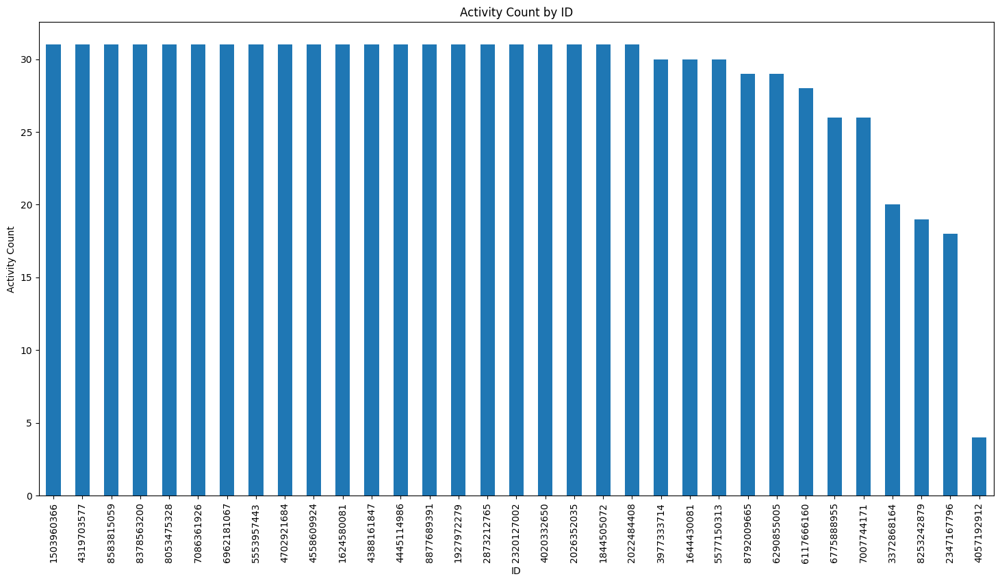

In [ ]:
# Create a bar chart to represent id and  ActivityDate in Ascending order bar chart with figure size

# Create a bar chart with figure size
plt.figure(figsize=(18, 9))
daily_activity_count.sort_values(ascending=False).plot.bar()

# Add title and labels
plt.title('Activity Count by ID')
plt.xlabel('ID')
plt.ylabel('Activity Count')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Show the plot
plt.show()


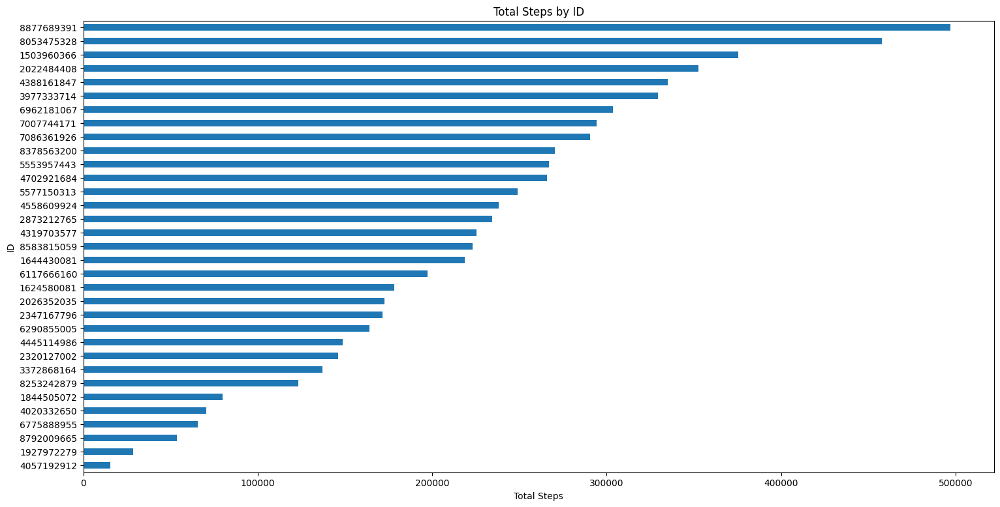

In [ ]:
# In a horizontal bar chart to represent ID and total steps

# Create a horizontal bar chart with figure size
plt.figure(figsize=(18, 9))

# Group by ID and sum the TotalSteps column
total_steps_by_id = dailyactivity.groupby('Id')['TotalSteps'].sum()

# Sort by total steps in descending order
total_steps_by_id = total_steps_by_id.sort_values(ascending=True)

# Plot the bar chart
total_steps_by_id.plot.barh()

# Add title and labels
plt.title('Total Steps by ID')
plt.xlabel('Total Steps')
plt.ylabel('ID')

# Show the plot
plt.show()


In [ ]:
# Creator pie chart for average of LightActiveDistance,ModeratelyActiveDistance,VeryActiveDistance and SedentaryActiveDistance

# Calculate the average of each activity distance type
average_light_active_distance = dailyactivity.groupby('Id')['LightActiveDistance'].mean()
average_moderately_active_distance = dailyactivity.groupby('Id')['ModeratelyActiveDistance'].mean()
average_very_active_distance = dailyactivity.groupby('Id')['VeryActiveDistance'].mean()
average_sedentary_active_distance = dailyactivity.groupby('Id')['SedentaryActiveDistance'].mean()

# Create a dictionary with the average values
data = {
    'Activity Type': ['Light Active Distance', 'Moderately Active Distance', 'Very Active Distance', 'Sedentary Active Distance'],
    'Average Distance': [average_light_active_distance.mean(), average_moderately_active_distance.mean(), average_very_active_distance.mean(), average_sedentary_active_distance.mean()]
}

# Create a pie chart
fig = go.Figure(data=[go.Pie(labels=data['Activity Type'], values=data['Average Distance'])])

# Update the layout
fig.update_layout(title='Average Activity Distance by Type')

# Show the pie chart
fig.show()


In [ ]:
# Build a pie chart to calculate Activity Distance by Type in Id

# Group by ID and sum the LightActiveDistance, ModeratelyActiveDistance, VeryActiveDistance, and SedentaryActiveDistance columns
activity_distance_by_id = dailyactivity.groupby('Id')[['LightActiveDistance', 'ModeratelyActiveDistance', 'VeryActiveDistance', 'SedentaryActiveDistance']].sum()

# Calculate the total distance for each ID
total_distance_by_id = activity_distance_by_id.sum(axis=1)

# Calculate the percentage of each activity distance type for each ID
activity_distance_by_id['LightActiveDistance'] = activity_distance_by_id['LightActiveDistance'] / total_distance_by_id * 100
activity_distance_by_id['ModeratelyActiveDistance'] = activity_distance_by_id['ModeratelyActiveDistance'] / total_distance_by_id * 100
activity_distance_by_id['VeryActiveDistance'] = activity_distance_by_id['VeryActiveDistance'] / total_distance_by_id * 100
activity_distance_by_id['SedentaryActiveDistance'] = activity_distance_by_id['SedentaryActiveDistance'] / total_distance_by_id * 100

# Create a pie chart for each ID
for id in activity_distance_by_id.index:
    data = [
        {'label': 'Light Active Distance', 'value': activity_distance_by_id.loc[id, 'LightActiveDistance']},
        {'label': 'Moderately Active Distance', 'value': activity_distance_by_id.loc[id, 'ModeratelyActiveDistance']},
        {'label': 'Very Active Distance', 'value': activity_distance_by_id.loc[id, 'VeryActiveDistance']},
        {'label': 'Sedentary Active Distance', 'value': activity_distance_by_id.loc[id, 'SedentaryActiveDistance']}
    ]

    fig = go.Figure(data=[go.Pie(labels=[d['label'] for d in data], values=[d['value'] for d in data])])

    fig.update_layout(title=f'Activity Distance by Type for ID {id}')
    fig.show()


In [ ]:
# Create a tree map to represent ID and TotalDistance  import plotly.graph_objects as go  # Group by ID and sum the TotalDistance column total_distance_by_id = dailyactivity.groupby('Id')['TotalDistance'].sum()  # Create the treemap fig = go.Figure(go.Treemap(     labels=total_distance_by_id.index.astype(str),     parents=[''] * len(total_distance_by_id),     values=total_distance_by_id,

# Create the treemap
fig = go.Figure(go.Treemap(
    labels=total_distance_by_id.index.astype(str),
    parents=[''] * len(total_distance_by_id),
    values=total_distance_by_id,
    textinfo='label+value'
))

# Update the layout
fig.update_layout(title='Total Distance by ID', height=600, width=1900)

# Show the treemap
fig.show()

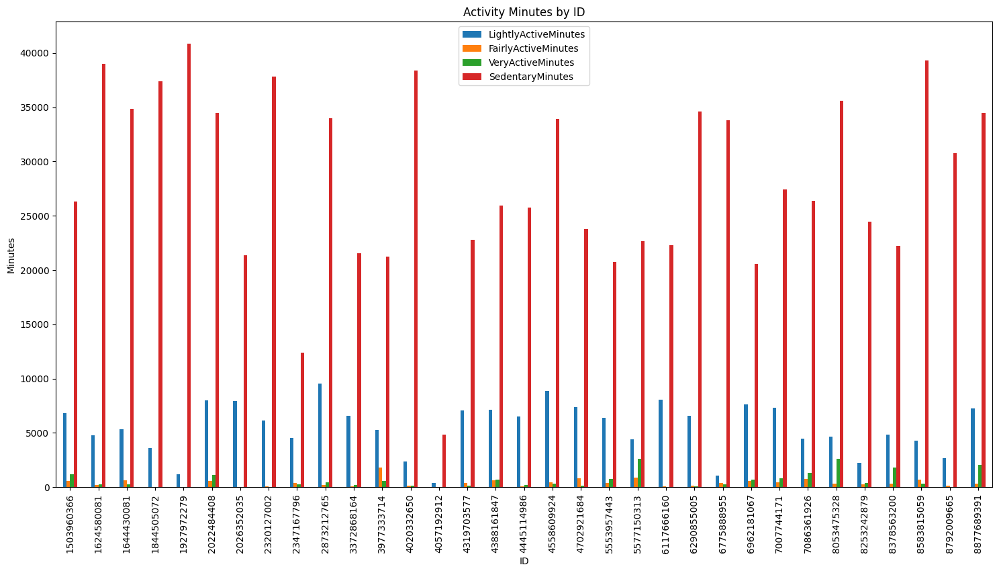

In [ ]:
# Create a group bar Chart to represent I D andLightlyActiveMinutes,FairlyActiveMinutes,VeryActiveMinutes and SedentaryMinutes

# Group by ID and sum the LightlyActiveMinutes, FairlyActiveMinutes, VeryActiveMinutes, and SedentaryMinutes columns
activity_minutes_by_id = dailyactivity.groupby('Id')[['LightlyActiveMinutes', 'FairlyActiveMinutes', 'VeryActiveMinutes', 'SedentaryMinutes']].sum()

# Create a grouped bar chart
activity_minutes_by_id.plot.bar(title='Activity Minutes by ID', figsize=(18, 9))

# Add labels and legend
plt.xlabel('ID')
plt.ylabel('Minutes')
plt.legend()

# Show the plot
plt.show()


# **Minutes Activity Merged analysis and visualisation**

In [ ]:
minutesactivity = pd.read_csv('/content/drive/MyDrive/Assignment-8/Minutes Activity Merged.csv')

<ipython-input-37-a92346f72cc1>:1: DtypeWarning:

Columns (5,70,135) have mixed types. Specify dtype option on import or set low_memory=False.



In [ ]:
minutesactivity.head()

,Unnamed: 0,Id,ActivityMinute,Intensity,Id.1,ActivityHour,Intensity00,Intensity01,Intensity02,Intensity03,...,Steps50,Steps51,Steps52,Steps53,Steps54,Steps55,Steps56,Steps57,Steps58,Steps59
0,0,1503960366,4-12-2016 12:00:00 AM,0,1.503960e+09,4-13-2016 12:00:00 AM,1.0,1.0,0.0,0.0,...,0.0,9.0,8.0,0.0,20.0,1.0,0.0,0.0,0.0,0.0
1,1,1503960366,4-12-2016 12:01:00 AM,0,1.503960e+09,4-13-2016 1:00:00 AM,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,1503960366,4-12-2016 12:02:00 AM,0,1.503960e+09,4-13-2016 2:00:00 AM,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,1503960366,4-12-2016 12:03:00 AM,0,1.503960e+09,4-13-2016 3:00:00 AM,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,1503960366,4-12-2016 12:04:00 AM,0,1.503960e+09,4-13-2016 4:00:00 AM,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
minutesactivity.drop(['Unnamed: 0', 'Id.1', 'Id.2', 'Id.3', 'ActivityMinute.1','ActivityHour.1','Id.4', 'ActivityMinute.2', 'Id.5', 'ActivityHour.2', 'ActivityHour'], axis=1, inplace=True)


In [ ]:
# Duplicate column ActivityMinute

minutesactivity['ActivityDate'] = minutesactivity['ActivityMinute']


In [ ]:
minutesactivity.head()

,Id,ActivityMinute,Intensity,Intensity00,Intensity01,Intensity02,Intensity03,Intensity04,Intensity05,Intensity06,...,Steps51,Steps52,Steps53,Steps54,Steps55,Steps56,Steps57,Steps58,Steps59,ActivityDate
0,1503960366,4-12-2016 12:00:00 AM,0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,...,9.0,8.0,0.0,20.0,1.0,0.0,0.0,0.0,0.0,4-12-2016 12:00:00 AM
1,1503960366,4-12-2016 12:01:00 AM,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4-12-2016 12:01:00 AM
2,1503960366,4-12-2016 12:02:00 AM,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4-12-2016 12:02:00 AM
3,1503960366,4-12-2016 12:03:00 AM,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4-12-2016 12:03:00 AM
4,1503960366,4-12-2016 12:04:00 AM,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4-12-2016 12:04:00 AM


In [ ]:
# Change the position of ActivityDate Column into second column

minutesactivity.insert(1, 'ActivityDate', minutesactivity.pop('ActivityDate'))
#minutesactivity.insert(3, 'ActivityHour', minutesactivity.pop('ActivityHour'))

minutesactivity.head()


,Id,ActivityDate,ActivityMinute,Intensity,Intensity00,Intensity01,Intensity02,Intensity03,Intensity04,Intensity05,...,Steps50,Steps51,Steps52,Steps53,Steps54,Steps55,Steps56,Steps57,Steps58,Steps59
0,1503960366,4-12-2016 12:00:00 AM,4-12-2016 12:00:00 AM,0,1.0,1.0,0.0,0.0,0.0,1.0,...,0.0,9.0,8.0,0.0,20.0,1.0,0.0,0.0,0.0,0.0
1,1503960366,4-12-2016 12:01:00 AM,4-12-2016 12:01:00 AM,0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1503960366,4-12-2016 12:02:00 AM,4-12-2016 12:02:00 AM,0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1503960366,4-12-2016 12:03:00 AM,4-12-2016 12:03:00 AM,0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1503960366,4-12-2016 12:04:00 AM,4-12-2016 12:04:00 AM,0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(minutesactivity.columns.tolist())


['Id', 'ActivityMinute', 'Intensity', 'Intensity00', 'Intensity01', 'Intensity02', 'Intensity03', 'Intensity04', 'Intensity05', 'Intensity06', 'Intensity07', 'Intensity08', 'Intensity09', 'Intensity10', 'Intensity11', 'Intensity12', 'Intensity13', 'Intensity14', 'Intensity15', 'Intensity16', 'Intensity17', 'Intensity18', 'Intensity19', 'Intensity20', 'Intensity21', 'Intensity22', 'Intensity23', 'Intensity24', 'Intensity25', 'Intensity26', 'Intensity27', 'Intensity28', 'Intensity29', 'Intensity30', 'Intensity31', 'Intensity32', 'Intensity33', 'Intensity34', 'Intensity35', 'Intensity36', 'Intensity37', 'Intensity38', 'Intensity39', 'Intensity40', 'Intensity41', 'Intensity42', 'Intensity43', 'Intensity44', 'Intensity45', 'Intensity46', 'Intensity47', 'Intensity48', 'Intensity49', 'Intensity50', 'Intensity51', 'Intensity52', 'Intensity53', 'Intensity54', 'Intensity55', 'Intensity56', 'Intensity57', 'Intensity58', 'Intensity59', 'Calories', 'Calories00', 'Calories01', 'Calories02', 'Calorie

In [ ]:
# in ActivityMinute column remove hours Minutes and Seconds

minutesactivity['ActivityMinute'] = minutesactivity['ActivityMinute'].apply(lambda x: x.split(':')[1])


In [ ]:
# Change the activity date format into date month year

minutesactivity['ActivityDate'] = pd.to_datetime(minutesactivity['ActivityDate']).dt.strftime('%d %M %Y')
#minutesactivity['ActivityDate'] = pd.to_datetime(minutesactivity['ActivityDate']).dt.strftime('%d %M %Y')


In [ ]:
# Show 5 row in ActivityMinute column

minutesactivity['ActivityMinute'].iloc[60]


'4-12-2016 1:00:00 AM'

In [ ]:
# Remove hours minutes and seconds in ActivityDate column

minutesactivity['ActivityDate'] = minutesactivity['ActivityDate'].apply(lambda x: x.split(' ')[0])


In [ ]:
minutesactivity

,Id,ActivityDate,ActivityMinute,Intensity,Intensity00,Intensity01,Intensity02,Intensity03,Intensity04,Intensity05,...,Steps50,Steps51,Steps52,Steps53,Steps54,Steps55,Steps56,Steps57,Steps58,Steps59
0,1503960366,12,4-12-2016 12:00:00 AM,0,1.0,1.0,0.0,0.0,0.0,1.0,...,0.0,9.0,8.0,0.0,20.0,1.0,0.0,0.0,0.0,0.0
1,1503960366,12,4-12-2016 12:01:00 AM,0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1503960366,12,4-12-2016 12:02:00 AM,0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1503960366,12,4-12-2016 12:03:00 AM,0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1503960366,12,4-12-2016 12:04:00 AM,0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32763,1503960366,04,5-4-2016 6:03:00 PM,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32764,1503960366,04,5-4-2016 6:04:00 PM,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32765,1503960366,04,5-4-2016 6:05:00 PM,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32766,1503960366,04,5-4-2016 6:06:00 PM,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


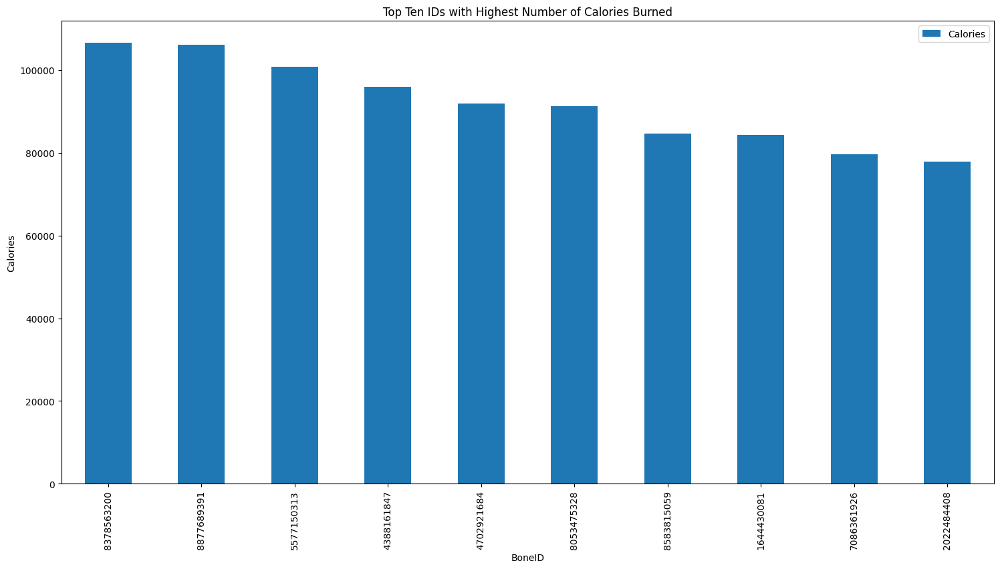

In [ ]:
# Create a bar graph top ten high calories bone ids

# Group by BoneID and sum the Calories column
calories_by_bone_id = dailyactivity.groupby('Id')['Calories'].sum()

# Sort by calories in descending order
calories_by_bone_id = calories_by_bone_id.sort_values(ascending=False)

# Get the top ten BoneIDs with the highest number of calories
top_ten_calories_bone_ids = calories_by_bone_id.head(10).index

# Create a bar chart for the top ten BoneIDs
top_ten_calories_bone_ids_df = calories_by_bone_id[top_ten_calories_bone_ids].to_frame().reset_index()
top_ten_calories_bone_ids_df.plot.bar(x='Id', y='Calories', figsize=(18, 9))

# Add title and labels
plt.title('Top Ten IDs with Highest Number of Calories Burned')
plt.xlabel('BoneID')
plt.ylabel('Calories')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Show the plot
plt.show()


In [ ]:
# Identify id Has high number value in calories

calories_by_id = dailyactivity.groupby('Id')['Calories'].sum()
max_calories_id = calories_by_id.idxmax()
print(f"ID with the highest number of calories: {max_calories_id}")


ID with the highest number of calories: 8378563200


In [ ]:
# Creator Line graph of calories in this id 8378563200

# Group by ActivityDate and sum the Calories column
calories_by_date = dailyactivity[dailyactivity['Id'] == 8378563200].groupby('ActivityDate')['Calories'].sum()

# Create a line chart
fig = go.Figure(data=go.Scatter(x=calories_by_date.index, y=calories_by_date.values, mode='lines'))

# Update the layout
fig.update_layout(title='Calories Burned by ID 8378563200', xaxis_title='ActivityDate', yaxis_title='Calories')

# Show the line chart
fig.show()


In [ ]:
# Identify Which id Has low number value in calories

min_calories_id = calories_by_id.idxmin()
print(f"ID with the lowest number of calories: {min_calories_id}")


ID with the lowest number of calories: 4057192912


In [ ]:
# Creator Line graph of calories in this id 4057192912

# Group by ActivityDate and sum the Calories column for ID 4057192912
calories_by_date = dailyactivity[dailyactivity['Id'] == 4057192912].groupby('ActivityDate')['Calories'].sum()

# Create a line chart
fig = go.Figure(data=go.Scatter(x=calories_by_date.index, y=calories_by_date.values, mode='lines'))

# Update the layout
fig.update_layout(title='Calories Burned by ID 4057192912', xaxis_title='ActivityDate', yaxis_title='Calories')

# Show the line chart
fig.show()


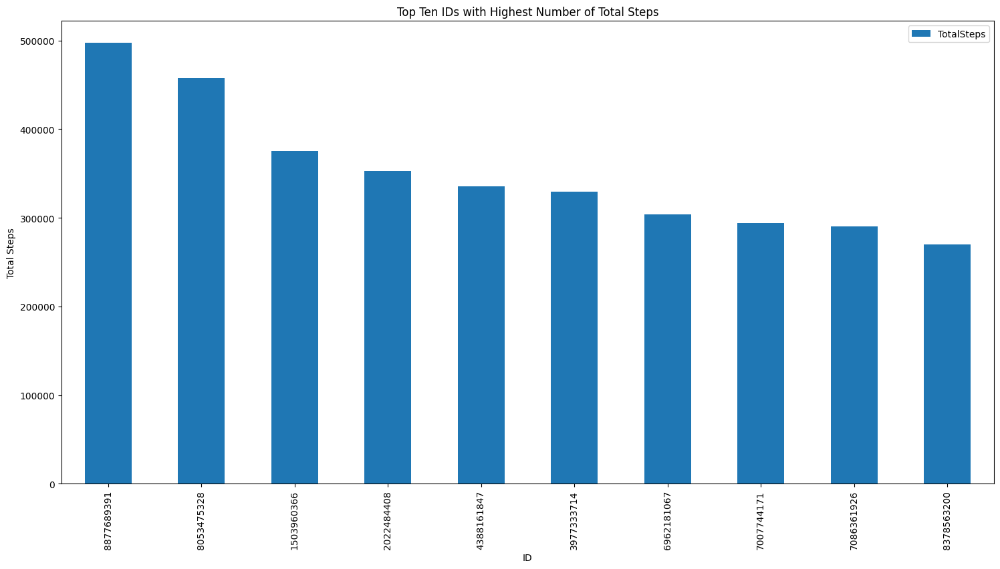

In [ ]:
# Create a bar chart to represent top ten ids with high number of total steps

# Group by ID and sum the TotalSteps column
total_steps_by_id = dailyactivity.groupby('Id')['TotalSteps'].sum()

# Sort by total steps in descending order
total_steps_by_id = total_steps_by_id.sort_values(ascending=False)

# Get the top 10 IDs with the highest number of total steps
top_ten_ids = total_steps_by_id.head(10).index

# Create a bar chart for the top ten IDs
top_ten_ids_df = total_steps_by_id[top_ten_ids].to_frame().reset_index()
top_ten_ids_df.plot.bar(x='Id', y='TotalSteps', figsize=(18, 9))

# Add title and labels
plt.title('Top Ten IDs with Highest Number of Total Steps')
plt.xlabel('ID')
plt.ylabel('Total Steps')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Show the plot
plt.show()


In [ ]:
# Create a line graph to represent total steps regarding this Id 8877689391

# Filter data for ID 8877689391
id_data = dailyactivity[dailyactivity['Id'] == 8877689391]

# Group by ActivityDate and sum the TotalSteps column
total_steps_by_date = id_data.groupby('ActivityDate')['TotalSteps'].sum()

# Create a line chart
fig = go.Figure(data=go.Scatter(x=total_steps_by_date.index, y=total_steps_by_date.values, mode='lines'))

# Update the layout
fig.update_layout(title='Total Steps for ID 8877689391', xaxis_title='ActivityDate', yaxis_title='Total Steps')

# Show the line chart
fig.show()


In [ ]:
# Which id Has low  number value in totalstpes

min_total_steps_id = total_steps_by_id.idxmin()
print(f"ID with the lowest number of total steps: {min_total_steps_id}")


ID with the lowest number of total steps: 4057192912


In [ ]:
# Create a line graph to represent total steps regarding this Id 8877689391

# Filter data for ID 8877689391
id_data = dailyactivity[dailyactivity['Id'] == 4057192912]

# Group by ActivityDate and sum the TotalSteps column
total_steps_by_date = id_data.groupby('ActivityDate')['TotalSteps'].sum()

# Create a line chart
fig = go.Figure(data=go.Scatter(x=total_steps_by_date.index, y=total_steps_by_date.values, mode='lines'))

# Update the layout
fig.update_layout(title='Total Steps for ID 4057192912', xaxis_title='ActivityDate', yaxis_title='Total Steps')

# Show the line chart
fig.show()


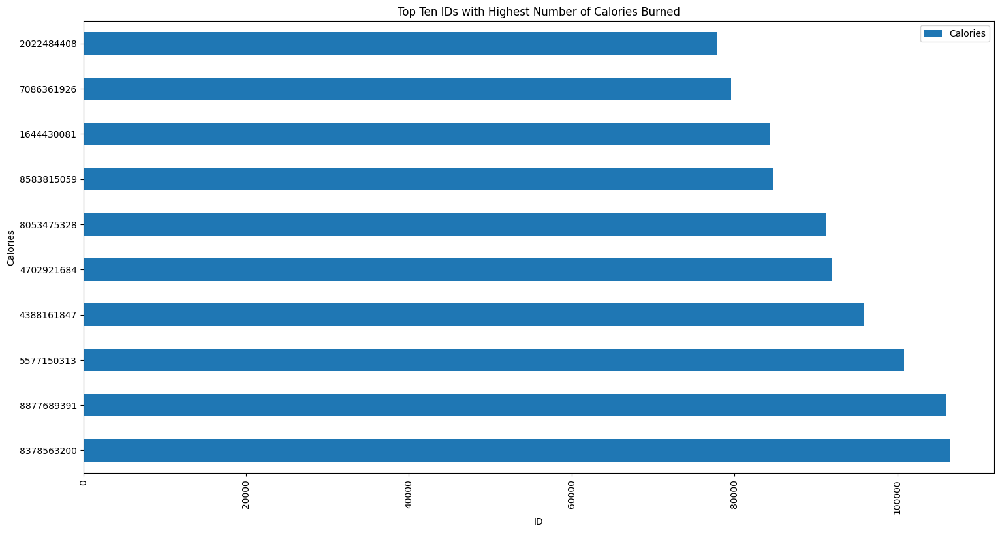

In [ ]:
# Find top 10 ActivityMinute people burn more calories in a Horizontal bar chart with Id

calories_by_id = dailyactivity.groupby('Id')['Calories'].sum()

# Sort by calories in descending order
calories_by_id = calories_by_id.sort_values(ascending=False)

# Get the top ten BoneIDs with the highest number of calories
top_ten_calories_bone_ids = calories_by_id.head(10).index

# Create a bar chart for the top ten BoneIDs
top_ten_calories_bone_ids_df = calories_by_bone_id[top_ten_calories_bone_ids].to_frame().reset_index()
top_ten_calories_bone_ids_df.plot.barh(x='Id', y='Calories', figsize=(18, 9))

# Add title and labels
plt.title('Top Ten IDs with Highest Number of Calories Burned')
plt.xlabel('ID')
plt.ylabel('Calories')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Show the plot
plt.show()


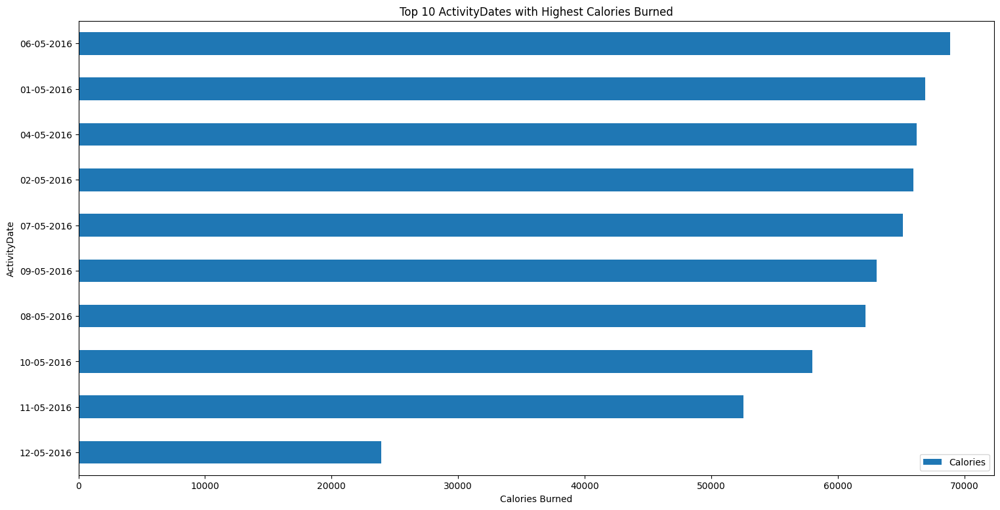

In [ ]:
# Which ActivityDate people burned more Calories, top 10 Ids Represent in horizontal bar chart

# Group by ActivityDate and sum the Calories column
calories_by_date = dailyactivity.groupby('ActivityDate')['Calories'].sum()

# Sort the Calories in descending order
calories_by_date = calories_by_date.sort_values(ascending=True)

# Get the top 10 ActivityDates with the highest Calories burned
top_ten_dates = calories_by_date.head(10)

# Create a horizontal bar chart
top_ten_dates.plot.barh(title='Top 10 ActivityDates with Highest Calories Burned', figsize=(18, 9))

# Add labels and legend
plt.xlabel('Calories Burned')
plt.ylabel('ActivityDate')
plt.legend()

# Show the plot
plt.show()


# **Hourly activity Merged Analysis and visualisation**

In [ ]:
HourlyActivity_Merged = pd.read_csv('/content/drive/MyDrive/Assignment-8/HourlyActivity_Merged.csv')

In [ ]:
HourlyActivity_Merged.head()

,Id,ActivityHour,TotalIntensity,AverageIntensity,StepTotal,Calories
0,1503960366,04-12-2016 00:00,20,0.333333,373,81
1,1503960366,04-12-2016 01:00,8,0.133333,160,61
2,1503960366,04-12-2016 02:00,7,0.116667,151,59
3,1503960366,04-12-2016 03:00,0,0.000000,0,47
4,1503960366,04-12-2016 04:00,0,0.000000,0,48


In [ ]:
HourlyActivity_Merged.shape

(22099, 6)

In [ ]:
HourlyActivity_Merged.info

<bound method DataFrame.info of                Id      ActivityHour  TotalIntensity  AverageIntensity  \
0      1503960366  04-12-2016 00:00              20          0.333333   
1      1503960366  04-12-2016 01:00               8          0.133333   
2      1503960366  04-12-2016 02:00               7          0.116667   
3      1503960366  04-12-2016 03:00               0          0.000000   
4      1503960366  04-12-2016 04:00               0          0.000000   
...           ...               ...             ...               ...   
22094  8877689391  05-12-2016 10:00              12          0.200000   
22095  8877689391  05-12-2016 11:00              29          0.483333   
22096  8877689391  05-12-2016 12:00              93          1.550000   
22097  8877689391  05-12-2016 13:00               6          0.100000   
22098  8877689391  05-12-2016 14:00               9          0.150000   

       StepTotal  Calories  
0            373        81  
1            160        61  
2   

In [ ]:
# Create a copy of ActivityHour

HourlyActivity_Merged['ActivityDate'] = HourlyActivity_Merged['ActivityHour'].copy()


In [ ]:
# Display duplicate values

duplicate_rows = HourlyActivity_Merged[HourlyActivity_Merged.duplicated()]

print(f"Number of duplicate rows: {len(duplicate_rows)}")

# Print the duplicate rows
print(duplicate_rows)


Number of duplicate rows: 0
Empty DataFrame
Columns: [Id, ActivityHour, TotalIntensity, AverageIntensity, StepTotal, Calories, ActivityDate]
Index: []


In [ ]:
# How many unique ids are there

HourlyActivity_Merged_ids = HourlyActivity_Merged['Id'].nunique()
print(f"Number of unique IDs: {HourlyActivity_Merged_ids}")


Number of unique IDs: 33


In [ ]:
# in ActivityHour Remove date month and year

HourlyActivity_Merged['ActivityHour'] = HourlyActivity_Merged['ActivityHour'].apply(lambda x: x.split(' ')[1])


In [ ]:
# in ActivityDate Remove Hours and minutes

HourlyActivity_Merged['ActivityDate'] = HourlyActivity_Merged['ActivityDate'].apply(lambda x: x.split(' ')[0])
# in ActivityHour column remove :

HourlyActivity_Merged['ActivityHour'] = HourlyActivity_Merged['ActivityHour'].str.replace(':00', '')


In [ ]:
# ActivityHour into position third column

HourlyActivity_Merged.insert(1, 'ActivityDate', HourlyActivity_Merged.pop('ActivityDate'))
HourlyActivity_Merged.head()


,Id,ActivityDate,ActivityHour,TotalIntensity,AverageIntensity,StepTotal,Calories
0,1503960366,04-12-2016,00,20,0.333333,373,81
1,1503960366,04-12-2016,01,8,0.133333,160,61
2,1503960366,04-12-2016,02,7,0.116667,151,59
3,1503960366,04-12-2016,03,0,0.000000,0,47
4,1503960366,04-12-2016,04,0,0.000000,0,48


In [ ]:
# Using dataframe HourlyActivity_Merged: Create a barcher to represent top 10 high active I D and activity date

import altair as alt
top_10 = HourlyActivity_Merged.sort_values(by='TotalIntensity', ascending=False).head(10)
chart = alt.Chart(top_10).mark_bar().encode(x='Id:N', y='TotalIntensity', color='ActivityDate:N').properties(height=400, width=800)
chart


alt.Chart(...)

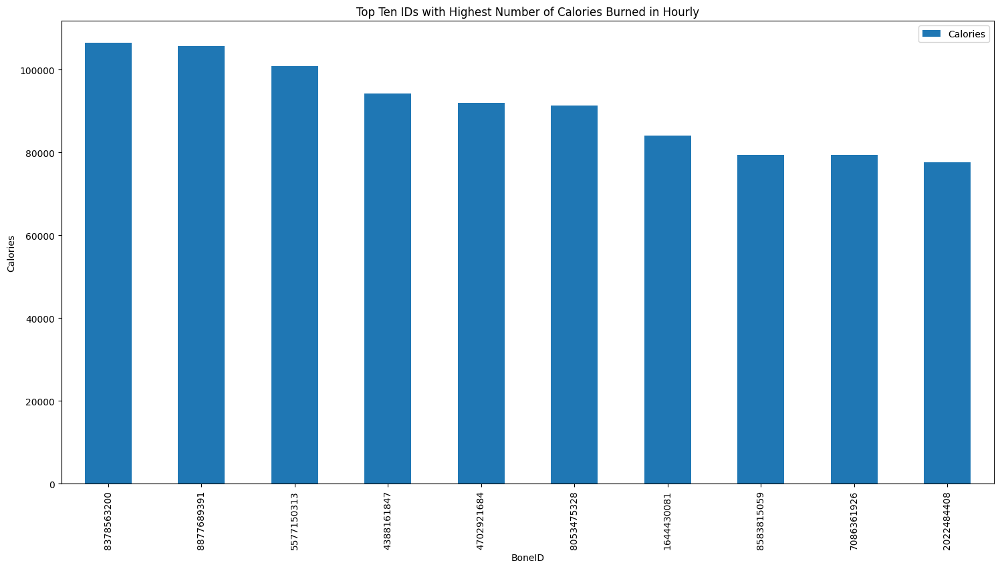

In [ ]:
# Create a bar graph top ten high calories bone ids

# Group by BoneID and sum the Calories column
calories_id = HourlyActivity_Merged.groupby('Id')['Calories'].sum()

# Sort by calories in descending order
calories_id = calories_id.sort_values(ascending=False)

# Get the top ten BoneIDs with the highest number of calories
top_ten_calories_ids = calories_id.head(10).index

# Create a bar chart for the top ten BoneIDs
top_ten_calories_ids_df = calories_id[top_ten_calories_ids].to_frame().reset_index()
top_ten_calories_ids_df.plot.bar(x='Id', y='Calories', figsize=(18, 9))

# Add title and labels
plt.title('Top Ten IDs with Highest Number of Calories Burned in Hourly')
plt.xlabel('BoneID')
plt.ylabel('Calories')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Show the plot
plt.show()


In [ ]:
# Create a Line graph to represent ActivityHour and Calories 8378563200

# Filter data for ID 8378563200
id_data = HourlyActivity_Merged[HourlyActivity_Merged['Id'] == 8378563200]

# Group by ActivityHour and sum the Calories column
calories_by_hour = id_data.groupby('ActivityHour')['Calories'].sum()

# Create a line chart
fig = go.Figure(data=go.Scatter(x=calories_by_hour.index, y=calories_by_hour.values, mode='lines'))

# Update the layout
fig.update_layout(title='Calories Burned by ID 8378563200', xaxis_title='ActivityHour', yaxis_title='Calories')

# Show the line chart
fig.show()


In [ ]:
# Create a Line graph to represent ActivityHour and Calories 3977333714

# Filter data for ID 8378563200
id_data = HourlyActivity_Merged[HourlyActivity_Merged['Id'] == 3977333714]

# Group by ActivityHour and sum the Calories column
calories_by_hour = id_data.groupby('ActivityHour')['Calories'].sum()

# Create a line chart
fig = go.Figure(data=go.Scatter(x=calories_by_hour.index, y=calories_by_hour.values, mode='lines'))

# Update the layout
fig.update_layout(title='Calories Burned by ID 3977333714', xaxis_title='ActivityHour', yaxis_title='Calories')

# Show the line chart
fig.show()

<Axes: title={'center': ' Average Highly Calories Burned in Hours'}, xlabel='ActivityHour'>

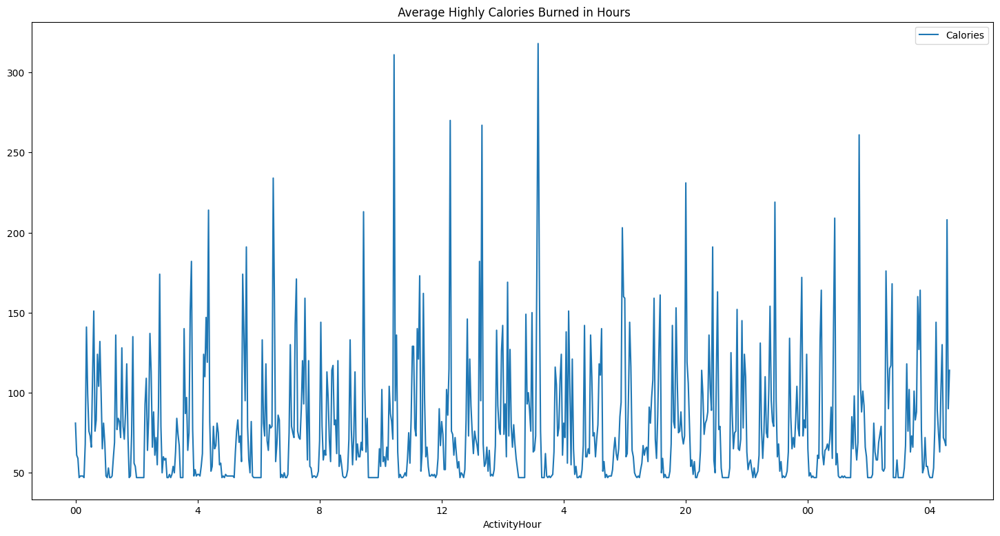

In [ ]:
# HourlyActivity_Merged[HourlyActivity_Merged.Id == HourlyActivity_Merged.Id.min()].plot(x='ActivityHour', y='Calories', kind='line') Add a title and figure size in this code

HourlyActivity_Merged[HourlyActivity_Merged.Id == HourlyActivity_Merged.Id.min()].plot(x='ActivityHour', y='Calories', kind='line', title=' Average Highly Calories Burned in Hours', figsize=(18, 9))


In [ ]:
# Create a Scatter plot graph for activityhour and steptotal

fig = px.scatter(HourlyActivity_Merged, x="ActivityHour", y="Calories", title="Scatter Plot of ActivityHour vs. Calories")

# Show the plot
fig.show()


In [ ]:
# Using dataframe HourlyActivity_Merged: Find which Id has has high value in steps total

HourlyActivity_Merged[HourlyActivity_Merged['StepTotal'] > 9000]['Id']


21548    8877689391
21669    8877689391
21810    8877689391
21954    8877689391
Name: Id, dtype: int64

In [ ]:
# Using dataframe HourlyActivity_Merged: Top 10 IDS has high value in steps total make it in a bar chart to visualise

# Sort by StepTotal
top_10_ids = HourlyActivity_Merged.sort_values(by="StepTotal", ascending=False).head(33)

# Create a bar chart
chart = alt.Chart(top_10_ids).mark_bar().encode(
    x=alt.X("Id:N", title="ID"),
    y=alt.Y("StepTotal:Q", title="StepTotal"),
).properties(width=600)

# Display the chart
chart


alt.Chart(...)

In [ ]:
# Create a Scatter plot graph for activityhour and steptotal

# Create a scatter plot
fig = px.scatter(HourlyActivity_Merged, x="ActivityHour", y="StepTotal", title="Scatter Plot of ActivityHour vs. StepTotal")

# Show the plot
fig.show()


In [ ]:
# Create a tree map for ID and steptotal Calculate in average

average_step_total_by_id = HourlyActivity_Merged.groupby('Id')['StepTotal'].mean()

# Create a dictionary with the average values
data = {
    'Id': average_step_total_by_id.index.astype(str),
    'Average Step Total': average_step_total_by_id.values,
}

# Create a treemap
fig = go.Figure(go.Treemap(
    labels=data['Id'],
    parents=[''] * len(data['Id']),
    values=data['Average Step Total'],
    textinfo='label+value'
))

# Update the layout
fig.update_layout(title='Average Step Total by ID', height=600, width=1900)

# Show the treemap
fig.show()


In [ ]:
# Create a Line graph to represent ActivityHour and Calories 8877689391

# Filter data for ID 8877689391
id_data = HourlyActivity_Merged[HourlyActivity_Merged['Id'] == 8877689391]

# Group by ActivityHour and sum the Calories column
calories_by_hour = id_data.groupby('ActivityHour')['StepTotal'].sum()

# Create a line chart
fig = go.Figure(data=go.Scatter(x=calories_by_hour.index, y=calories_by_hour.values, mode='lines'))

# Update the layout
fig.update_layout(title='Calories Burned by ID 1927972279', xaxis_title='ActivityHour', yaxis_title='StepTotal')

# Show the line chart
fig.show()

In [ ]:
# Create a Line graph to represent ActivityHour and Calories 1927972279

# Filter data for ID 1927972279
id_data = HourlyActivity_Merged[HourlyActivity_Merged['Id'] == 1927972279]

# Group by ActivityHour and sum the Calories column
calories_by_hour = id_data.groupby('ActivityHour')['StepTotal'].sum()

# Create a line chart
fig = go.Figure(data=go.Scatter(x=calories_by_hour.index, y=calories_by_hour.values, mode='lines'))

# Update the layout
fig.update_layout(title='Calories Burned by ID 1927972279', xaxis_title='ActivityHour', yaxis_title='StepTotal')

# Show the line chart
fig.show()

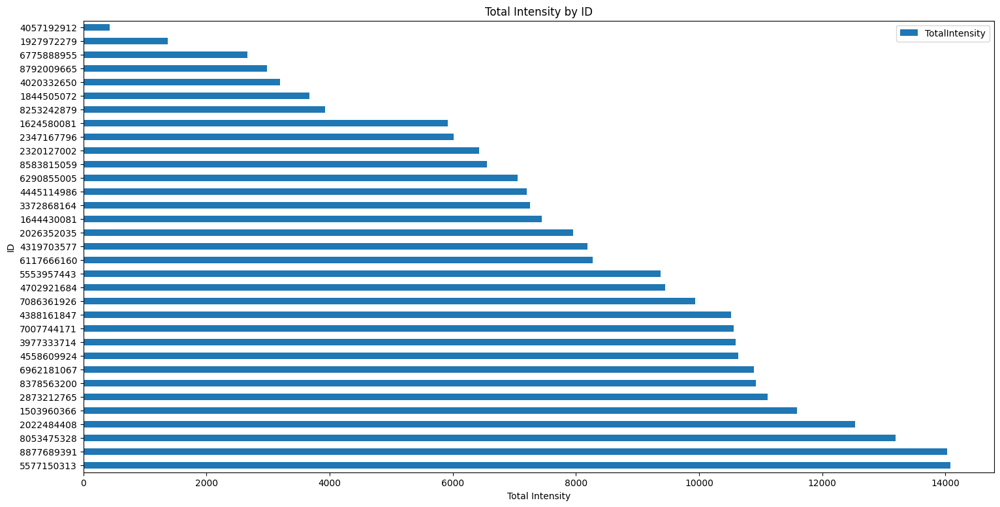

In [ ]:
# Create a horizontal bar for all I D and total intensity

# Group by Id and sum the TotalIntensity column
total_intensity_by_id = HourlyActivity_Merged.groupby('Id')['TotalIntensity'].sum()

# Sort by total intensity in descending order
total_intensity_by_id = total_intensity_by_id.sort_values(ascending=False)

# Create a horizontal bar chart
total_intensity_by_id.plot.barh(title='Total Intensity by ID', figsize=(18, 9))

# Add labels and legend
plt.xlabel('Total Intensity')
plt.ylabel('ID')
plt.legend()

# Show the plot
plt.show()


In [ ]:
HourlyActivity_Merged.tail()

,Id,ActivityDate,ActivityHour,TotalIntensity,AverageIntensity,StepTotal,Calories
22094,8877689391,05-12-2016,10,12,0.200000,514,126
22095,8877689391,05-12-2016,11,29,0.483333,1407,192
22096,8877689391,05-12-2016,12,93,1.550000,3135,321
22097,8877689391,05-12-2016,13,6,0.100000,307,101
22098,8877689391,05-12-2016,14,9,0.150000,457,113


# **Sleep Data Merged Analysis and visualisation**

**Understand the give Dataset**

In [ ]:
ds = pd.read_csv('/content/drive/MyDrive/Assignment-8/sleepDay_merged.csv')
ms = pd.read_csv('/content/drive/MyDrive/Assignment-8/minuteSleep_merged.csv')

In [ ]:
ds.shape

(413, 5)

In [ ]:
ds.columns

Index(['Id', 'SleepDay', 'TotalSleepRecords', 'TotalMinutesAsleep',
       'TotalTimeInBed'],
      dtype='object')

In [ ]:
ds.info

<bound method DataFrame.info of              Id               SleepDay  TotalSleepRecords  TotalMinutesAsleep  \
0    1503960366  4/12/2016 12:00:00 AM                  1                 327   
1    1503960366  4/13/2016 12:00:00 AM                  2                 384   
2    1503960366  4/15/2016 12:00:00 AM                  1                 412   
3    1503960366  4/16/2016 12:00:00 AM                  2                 340   
4    1503960366  4/17/2016 12:00:00 AM                  1                 700   
..          ...                    ...                ...                 ...   
408  8792009665  4/30/2016 12:00:00 AM                  1                 343   
409  8792009665   5/1/2016 12:00:00 AM                  1                 503   
410  8792009665   5/2/2016 12:00:00 AM                  1                 415   
411  8792009665   5/3/2016 12:00:00 AM                  1                 516   
412  8792009665   5/4/2016 12:00:00 AM                  1                 439

In [ ]:
ds.isnull().sum()

Id                    0
SleepDay              0
TotalSleepRecords     0
TotalMinutesAsleep    0
TotalTimeInBed        0
dtype: int64

In [ ]:
ms.shape

(188521, 4)

In [ ]:
ms.columns

Index(['Id', 'date', 'value', 'logId'], dtype='object')

In [ ]:
ms.info

<bound method DataFrame.info of                 Id                  date  value        logId
0       1503960366  4/12/2016 2:47:30 AM      3  11380564589
1       1503960366  4/12/2016 2:48:30 AM      2  11380564589
2       1503960366  4/12/2016 2:49:30 AM      1  11380564589
3       1503960366  4/12/2016 2:50:30 AM      1  11380564589
4       1503960366  4/12/2016 2:51:30 AM      1  11380564589
...            ...                   ...    ...          ...
188516  8792009665   5/4/2016 9:59:00 AM      1  11552534115
188517  8792009665  5/4/2016 10:00:00 AM      1  11552534115
188518  8792009665  5/4/2016 10:01:00 AM      1  11552534115
188519  8792009665  5/4/2016 10:02:00 AM      1  11552534115
188520  8792009665  5/4/2016 10:03:00 AM      1  11552534115

[188521 rows x 4 columns]>

In [ ]:
ms.isnull().sum()

Id       0
date     0
value    0
logId    0
dtype: int64

**Merge The Two Datasets**

In [ ]:
# merge ds and ms

SleepMerged = pd.merge(ds, ms, on='Id', how='inner')


In [ ]:
SleepMerged

,Id,SleepDay,TotalSleepRecords,TotalMinutesAsleep,TotalTimeInBed,date,value,logId
0,1503960366,4/12/2016 12:00:00 AM,1,327,346,4/12/2016 2:47:30 AM,3,11380564589
1,1503960366,4/12/2016 12:00:00 AM,1,327,346,4/12/2016 2:48:30 AM,2,11380564589
2,1503960366,4/12/2016 12:00:00 AM,1,327,346,4/12/2016 2:49:30 AM,1,11380564589
3,1503960366,4/12/2016 12:00:00 AM,1,327,346,4/12/2016 2:50:30 AM,1,11380564589
4,1503960366,4/12/2016 12:00:00 AM,1,327,346,4/12/2016 2:51:30 AM,1,11380564589
...,...,...,...,...,...,...,...,...
4702219,8792009665,5/4/2016 12:00:00 AM,1,439,463,5/4/2016 9:59:00 AM,1,11552534115
4702220,8792009665,5/4/2016 12:00:00 AM,1,439,463,5/4/2016 10:00:00 AM,1,11552534115
4702221,8792009665,5/4/2016 12:00:00 AM,1,439,463,5/4/2016 10:01:00 AM,1,11552534115
4702222,8792009665,5/4/2016 12:00:00 AM,1,439,463,5/4/2016 10:02:00 AM,1,11552534115


In [ ]:
# Display duplicates

duplicate_rows = SleepMerged[SleepMerged.duplicated()]
print("Number of duplicate rows:", len(duplicate_rows))
print(duplicate_rows)


Number of duplicate rows: 51834
                 Id               SleepDay  TotalSleepRecords  \
1697139  4388161847   5/5/2016 12:00:00 AM                  1   
1697140  4388161847   5/5/2016 12:00:00 AM                  1   
1697141  4388161847   5/5/2016 12:00:00 AM                  1   
1697142  4388161847   5/5/2016 12:00:00 AM                  1   
1697143  4388161847   5/5/2016 12:00:00 AM                  1   
...             ...                    ...                ...   
4344026  8378563200  4/25/2016 12:00:00 AM                  1   
4344027  8378563200  4/25/2016 12:00:00 AM                  1   
4344028  8378563200  4/25/2016 12:00:00 AM                  1   
4344029  8378563200  4/25/2016 12:00:00 AM                  1   
4344030  8378563200  4/25/2016 12:00:00 AM                  1   

         TotalMinutesAsleep  TotalTimeInBed                  date  value  \
1697139                 471             495  4/14/2016 8:09:00 PM      2   
1697140                 471        

In [ ]:
# Drop all the duplicates

SleepMerged.drop_duplicates(inplace=True)


In [ ]:
duplicate_rows = SleepMerged[SleepMerged.duplicated()]
print("Number of duplicate rows:", len(duplicate_rows))
print(duplicate_rows)

Number of duplicate rows: 0
Empty DataFrame
Columns: [Id, SleepDay, TotalSleepRecords, TotalMinutesAsleep, TotalTimeInBed, date, value, logId]
Index: []


In [ ]:
SleepMerged.head()

,Id,SleepDay,TotalSleepRecords,TotalMinutesAsleep,TotalTimeInBed,date,value,logId
0,1503960366,4/12/2016 12:00:00 AM,1,327,346,4/12/2016 2:47:30 AM,3,11380564589
1,1503960366,4/12/2016 12:00:00 AM,1,327,346,4/12/2016 2:48:30 AM,2,11380564589
2,1503960366,4/12/2016 12:00:00 AM,1,327,346,4/12/2016 2:49:30 AM,1,11380564589
3,1503960366,4/12/2016 12:00:00 AM,1,327,346,4/12/2016 2:50:30 AM,1,11380564589
4,1503960366,4/12/2016 12:00:00 AM,1,327,346,4/12/2016 2:51:30 AM,1,11380564589


**Get the insights from the dataset**

In [ ]:
# In sleep day remove hours minutes seconds and AM, PM

SleepMerged['SleepDay'] = SleepMerged['SleepDay'].apply(lambda x: x.split(' ')[0])


In [ ]:
# In date column remove day month year

SleepMerged['SleepDay'] = SleepMerged['SleepDay'].apply(lambda x: x.split(' ')[0])


In [ ]:
# In date Remove date month and year

SleepMerged['date'] = SleepMerged['date'].apply(lambda x: x.split(' ')[1])


In [ ]:
# Rename the date column to SleepTime

SleepMerged.rename(columns={'date': 'SleepTime'}, inplace=True)
SleepMerged.rename(columns={'SleepDay': 'SleepDate'}, inplace=True)


In [ ]:
# Add column SleepDay Based on the SleepDate date in the year of 2016

SleepMerged['SleepDay'] = pd.to_datetime(SleepMerged['SleepDate']).dt.day_name()


In [ ]:
# Rearrange the columns in this order Id,SleepTime,SleepDay,SleepDate,TotalTimeInBed,TotalMinutesAsleep,TotalSleepRecords,value,logId

SleepMerged = SleepMerged[['Id', 'SleepTime', 'SleepDay', 'SleepDate', 'TotalTimeInBed', 'TotalMinutesAsleep', 'TotalSleepRecords', 'value', 'logId']]


In [ ]:
SleepMerged.head()

,Id,SleepTime,SleepDay,SleepDate,TotalTimeInBed,TotalMinutesAsleep,TotalSleepRecords,value,logId
0,1503960366,2:47:30,Tuesday,4/12/2016,346,327,1,3,11380564589
1,1503960366,2:48:30,Tuesday,4/12/2016,346,327,1,2,11380564589
2,1503960366,2:49:30,Tuesday,4/12/2016,346,327,1,1,11380564589
3,1503960366,2:50:30,Tuesday,4/12/2016,346,327,1,1,11380564589
4,1503960366,2:51:30,Tuesday,4/12/2016,346,327,1,1,11380564589


In [ ]:
# Which ID has more sleep day

most_sleep_id = SleepMerged.groupby('Id')['SleepDay'].count().sort_values(ascending=False).head(1).index[0]
print(f"ID with the most sleep days: {most_sleep_id}")


ID with the most sleep days: 5553957443


In [ ]:
# Create a Line graph for this ID 5553957443 and sleepDAY

# Filter data for ID 5553957443
id_data = SleepMerged[SleepMerged['Id'] == 5553957443]

# Group by SleepDay and sum the TotalMinutesAsleep column
sleep_by_day = id_data.groupby('SleepDay')['TotalMinutesAsleep'].sum()

# Create a line chart
fig = go.Figure(data=go.Scatter(x=sleep_by_day.index, y=sleep_by_day.values, mode='lines'))

# Update the layout
fig.update_layout(title='Total Sleep Time by Day for ID 5553957443', xaxis_title='SleepDay', yaxis_title='TotalMinutesAsleep')

# Show the line chart
fig.show()


In [ ]:
# Create a tree map to represent I D and total minutes asleep

average_minutes_asleep_by_id = SleepMerged.groupby('Id')['TotalMinutesAsleep'].mean()

# Create a dictionary with the average values
data = {
    'Id': average_minutes_asleep_by_id.index.astype(str),
    'Average Minutes Asleep': average_minutes_asleep_by_id.values,
}

# Create a treemap
fig = go.Figure(go.Treemap(
    labels=data['Id'],
    parents=[''] * len(data['Id']),
    values=data['Average Minutes Asleep'],
    textinfo='label+value'
))

# Update the layout
fig.update_layout(title='Average Minutes Asleep by ID', height=600, width=1900)

# Show the treemap
fig.show()


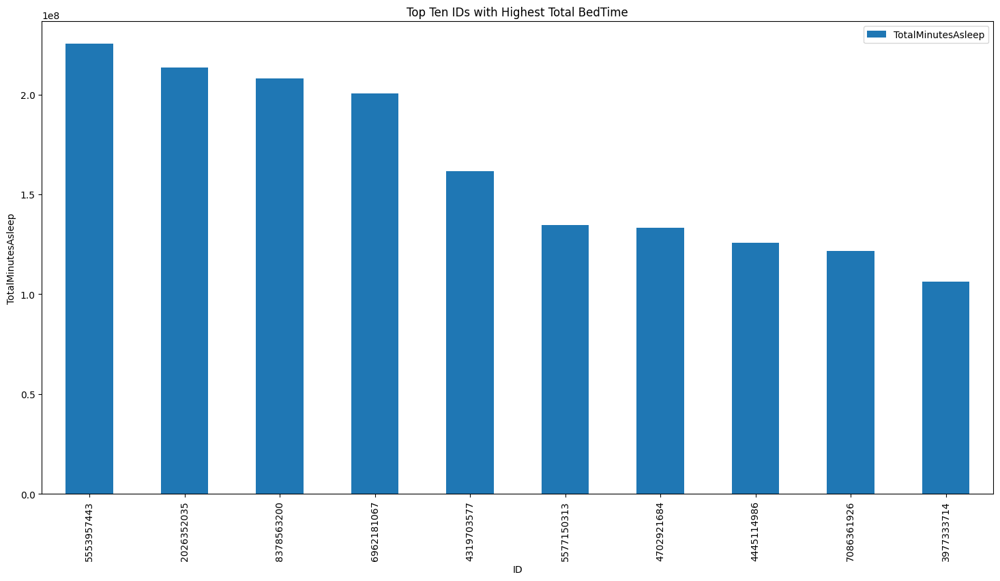

In [ ]:
# Create a bar graph to represent ID and total bedtime top ten

# Group by ID and sum the TotalMinutesAsleep column
total_minutes_asleep_by_id = SleepMerged.groupby('Id')['TotalMinutesAsleep'].sum()

# Sort by total minutes asleep in descending order
total_minutes_asleep_by_id = total_minutes_asleep_by_id.sort_values(ascending=False)

# Get the top ten IDs with the highest total minutes asleep
top_ten_ids = total_minutes_asleep_by_id.head(10).index

# Create a bar chart for the top ten IDs
top_ten_ids_df = total_minutes_asleep_by_id[top_ten_ids].to_frame().reset_index()
top_ten_ids_df.plot.bar(x='Id', y='TotalMinutesAsleep', figsize=(18, 9))

# Add title and labels
plt.title('Top Ten IDs with Highest Total BedTime')
plt.xlabel('ID')
plt.ylabel('TotalMinutesAsleep')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Show the plot
plt.show()


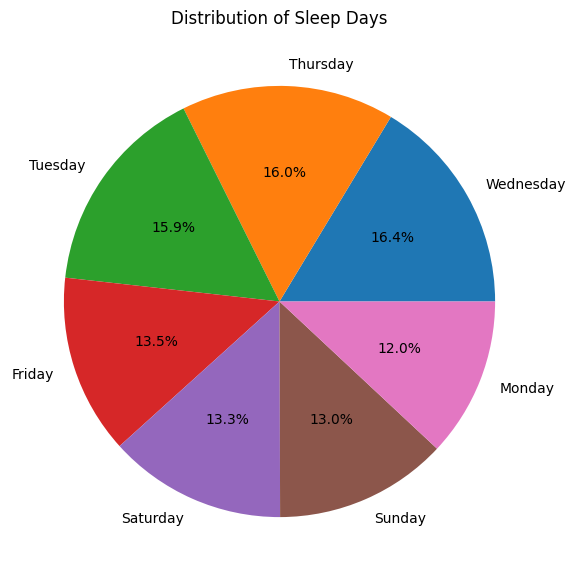

In [ ]:
# Create a pie chart Which sleep day has more values Show them with the percentage

sleep_day_counts = SleepMerged['SleepDay'].value_counts()

# Create a pie chart
plt.figure(figsize=(10, 7))
plt.pie(sleep_day_counts, labels=sleep_day_counts.index, autopct='%1.1f%%')
plt.title('Distribution of Sleep Days')
plt.show()


In [ ]:
SleepMerged.head()

,Id,SleepTime,SleepDay,SleepDate,TotalTimeInBed,TotalMinutesAsleep,TotalSleepRecords,value,logId
0,1503960366,2:47:30,Tuesday,4/12/2016,346,327,1,3,11380564589
1,1503960366,2:48:30,Tuesday,4/12/2016,346,327,1,2,11380564589
2,1503960366,2:49:30,Tuesday,4/12/2016,346,327,1,1,11380564589
3,1503960366,2:50:30,Tuesday,4/12/2016,346,327,1,1,11380564589
4,1503960366,2:51:30,Tuesday,4/12/2016,346,327,1,1,11380564589


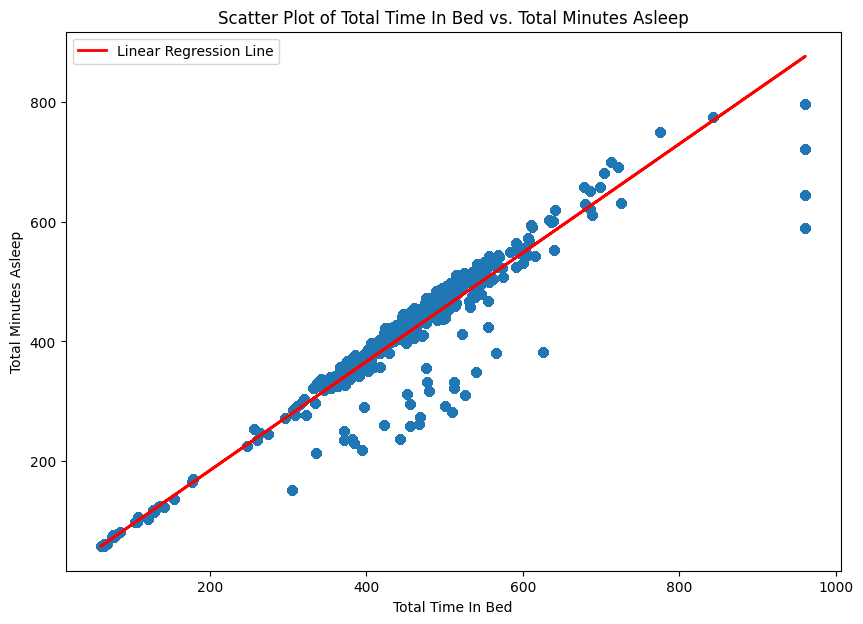

In [ ]:
# Assuming you have already loaded your data into the 'SleepMerged' DataFrame

# Get the data from the SleepMerged DataFrame
total_bedtime = SleepMerged['TotalTimeInBed']
total_sleep_records = SleepMerged['TotalMinutesAsleep']

# Create the scatter plot
plt.figure(figsize=(10, 7))
plt.scatter(total_bedtime, total_sleep_records, alpha=0.5)  # 'alpha' controls transparency for better visualization

# Add labels and title
plt.xlabel('Total Time In Bed')
plt.ylabel('Total Minutes Asleep')
plt.title('Scatter Plot of Total Time In Bed vs. Total Minutes Asleep')

# Perform linear regression
slope, intercept, _, _, _ = linregress(total_bedtime, total_sleep_records)
line = slope * total_bedtime + intercept

# Plot the regression line
plt.plot(total_bedtime, line, color='red', linewidth=2, label='Linear Regression Line')

# Show the legend
plt.legend()

# Show the plot
plt.show()


# **Weight Data Analysis and visualisation**

In [ ]:
 WeightData = pd.read_csv('/content/drive/MyDrive/Assignment-8/weightLogInfo_merged.csv')

In [ ]:
WeightData.shape

(67, 8)

In [ ]:
WeightData.columns

Index(['Id', 'Date', 'WeightKg', 'WeightPounds', 'Fat', 'BMI',
       'IsManualReport', 'LogId'],
      dtype='object')

In [ ]:
WeightData.info

<bound method DataFrame.info of             Id                   Date    WeightKg  WeightPounds   Fat  \
0   1503960366   5/2/2016 11:59:59 PM   52.599998    115.963147  22.0   
1   1503960366   5/3/2016 11:59:59 PM   52.599998    115.963147   NaN   
2   1927972279   4/13/2016 1:08:52 AM  133.500000    294.317120   NaN   
3   2873212765  4/21/2016 11:59:59 PM   56.700001    125.002104   NaN   
4   2873212765  5/12/2016 11:59:59 PM   57.299999    126.324875   NaN   
..         ...                    ...         ...           ...   ...   
62  8877689391    5/6/2016 6:43:35 AM   85.000000    187.392923   NaN   
63  8877689391    5/8/2016 7:35:53 AM   85.400002    188.274775   NaN   
64  8877689391    5/9/2016 6:39:44 AM   85.500000    188.495234   NaN   
65  8877689391   5/11/2016 6:51:47 AM   85.400002    188.274775   NaN   
66  8877689391   5/12/2016 6:42:53 AM   84.000000    185.188300   NaN   

          BMI  IsManualReport          LogId  
0   22.650000            True  1462233599000

In [ ]:
WeightData.dtypes

Id                  int64
Date               object
WeightKg          float64
WeightPounds      float64
Fat               float64
BMI               float64
IsManualReport       bool
LogId               int64
dtype: object

In [ ]:
WeightData.isnull().sum()

Id                 0
Date               0
WeightKg           0
WeightPounds       0
Fat               65
BMI                0
IsManualReport     0
LogId              0
dtype: int64

In [ ]:
# Fill fat column null values using average

WeightData['Fat'].fillna(WeightData['Fat'].mean(), inplace=True)


In [ ]:
WeightData.isnull().sum()

Id                0
Date              0
WeightKg          0
WeightPounds      0
Fat               0
BMI               0
IsManualReport    0
LogId             0
dtype: int64

In [ ]:
# copy of date column

WeightData['WeightTime'] = WeightData['Date']


In [ ]:
# Rename date column

WeightData.rename(columns={'Date': 'WeightDate'}, inplace=True)


In [ ]:
WeightData['WeightDate'] = WeightData['WeightDate'].apply(lambda x: x.split(' ')[0])


In [ ]:
# in ActivityHour Remove date month and year

WeightData['WeightTime'] = WeightData['WeightTime'].apply(lambda x: x.split(' ')[1])


In [ ]:
WeightData.head()

,Id,WeightDate,WeightKg,WeightPounds,Fat,BMI,IsManualReport,LogId,WeightTime
0,1503960366,5/2/2016,52.599998,115.963147,22.0,22.650000,True,1462233599000,11:59:59
1,1503960366,5/3/2016,52.599998,115.963147,23.5,22.650000,True,1462319999000,11:59:59
2,1927972279,4/13/2016,133.500000,294.317120,23.5,47.540001,False,1460509732000,1:08:52
3,2873212765,4/21/2016,56.700001,125.002104,23.5,21.450001,True,1461283199000,11:59:59
4,2873212765,5/12/2016,57.299999,126.324875,23.5,21.690001,True,1463097599000,11:59:59


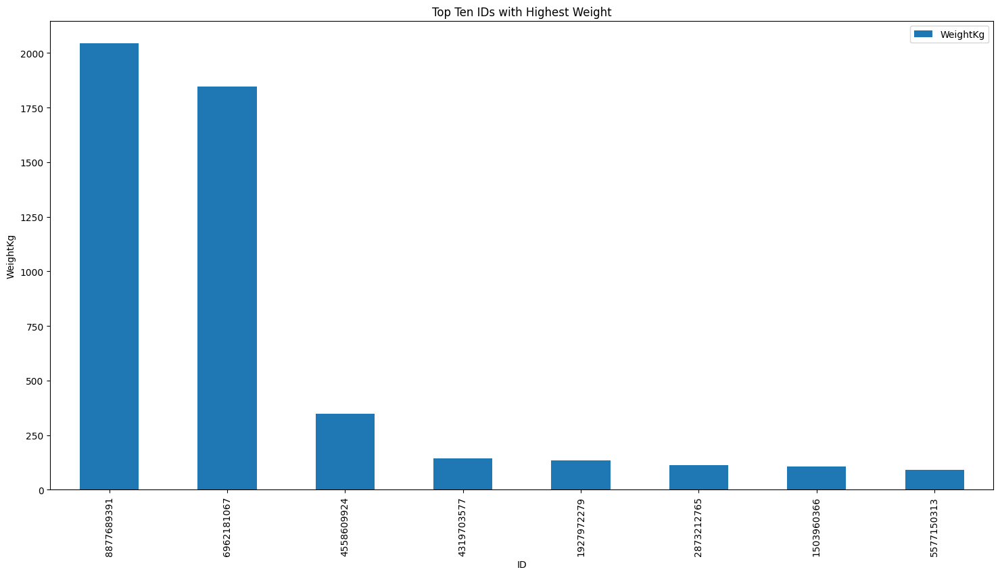

In [ ]:
# Create Vertical bar chart to top 10 Id  represent which has high number of WeightKg

# Group by Id and sum the WeightKg column
weight_by_id = WeightData.groupby('Id')['WeightKg'].sum()

# Sort by weight in descending order
weight_by_id = weight_by_id.sort_values(ascending=False)

# Get the top ten IDs with the highest weight
top_ten_ids = weight_by_id.head(10).index

# Create a bar chart for the top ten IDs
top_ten_ids_df = weight_by_id[top_ten_ids].to_frame().reset_index()
top_ten_ids_df.plot.bar(x='Id', y='WeightKg', figsize=(18, 9))

# Add title and labels
plt.title('Top Ten IDs with Highest Weight')
plt.xlabel('ID')
plt.ylabel('WeightKg')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Show the plot
plt.show()


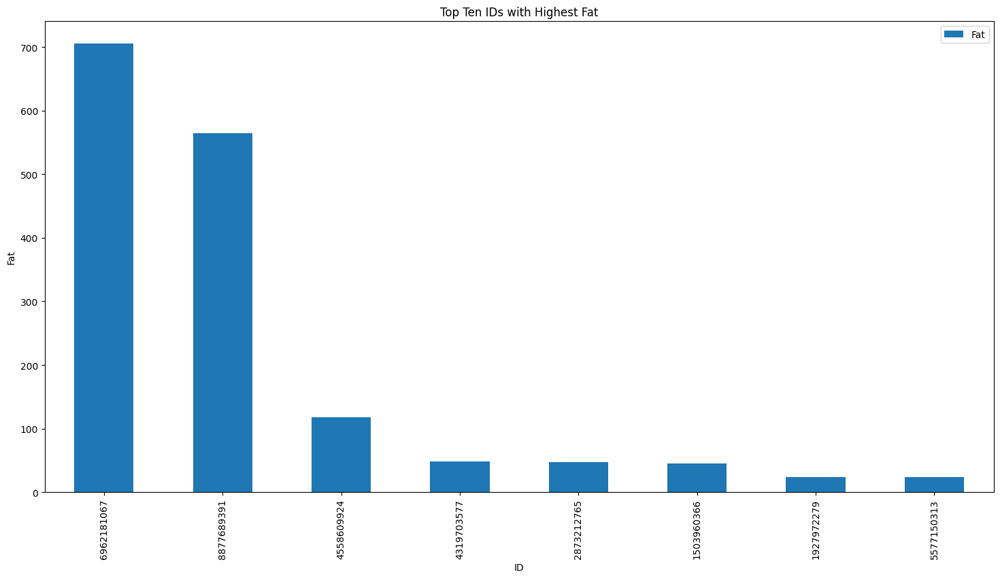

In [ ]:
# Create bar chart which id has more fat top ten

# Group by ID and sum the Fat column
fat_by_id = WeightData.groupby('Id')['Fat'].sum()

# Sort by fat in descending order
fat_by_id = fat_by_id.sort_values(ascending=False)

# Get the top ten IDs with the highest fat
top_ten_ids = fat_by_id.head(10).index

# Create a bar chart for the top ten IDs
top_ten_ids_df = fat_by_id[top_ten_ids].to_frame().reset_index()
top_ten_ids_df.plot.bar(x='Id', y='Fat', figsize=(18, 9))

# Add title and labels
plt.title('Top Ten IDs with Highest Fat')
plt.xlabel('ID')
plt.ylabel('Fat')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Show the plot
plt.show()


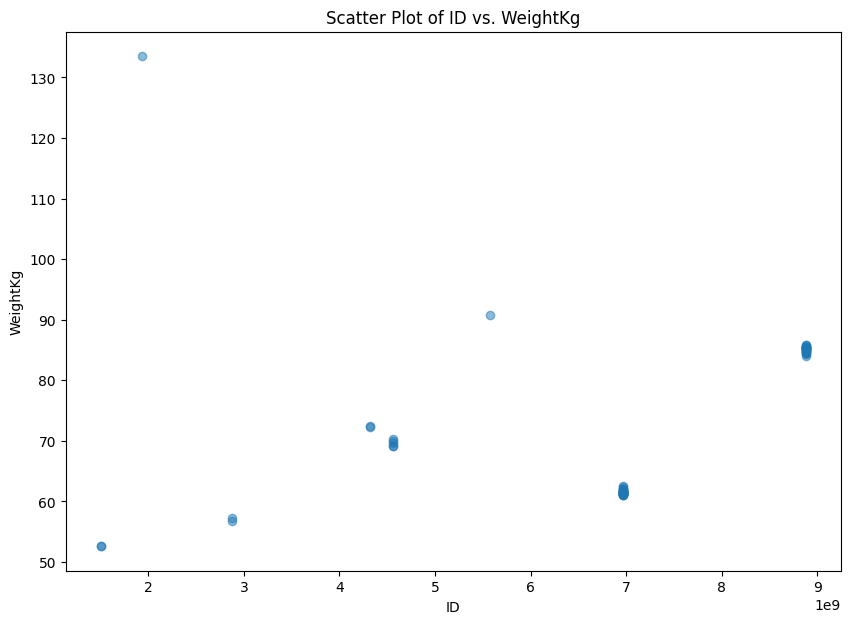

In [ ]:
# Create a scatter plot to represent id and weight kg

# Create a scatter plot
plt.figure(figsize=(10, 7))
plt.scatter(WeightData['Id'], WeightData['WeightKg'], alpha=0.5)  # 'alpha' controls transparency for better visualization

# Add labels and title
plt.xlabel('ID')
plt.ylabel('WeightKg')
plt.title('Scatter Plot of ID vs. WeightKg')

# Show the plot
plt.show()


In [ ]:
WeightData.head()

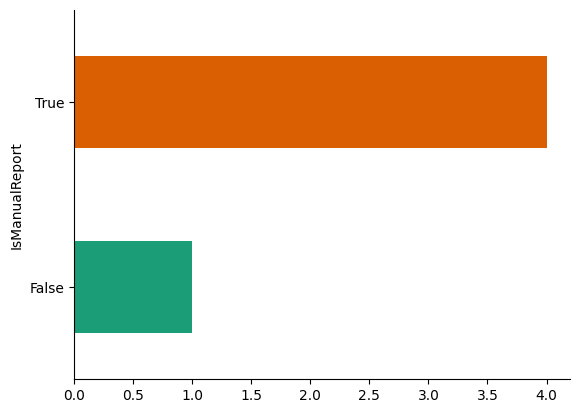

In [ ]:
# Create a bar chart to represent ismanualreport

_df_5.groupby('IsManualReport').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

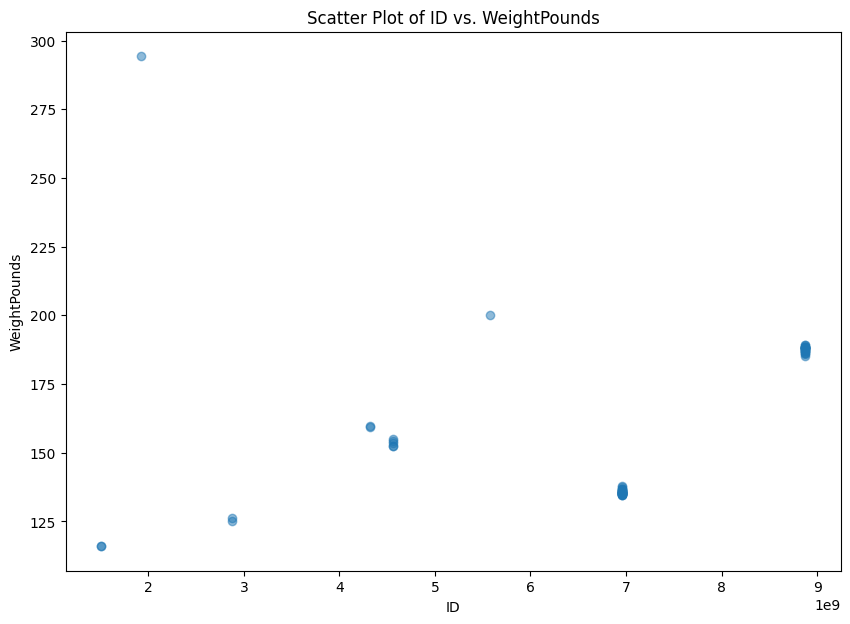

In [ ]:
# Create a scatter plot to represent id and WeightPounds

plt.figure(figsize=(10, 7))
plt.scatter(WeightData['Id'], WeightData['WeightPounds'], alpha=0.5)  # 'alpha' controls transparency for better visualization

# Add labels and title
plt.xlabel('ID')
plt.ylabel('WeightPounds')
plt.title('Scatter Plot of ID vs. WeightPounds')

# Show the plot
plt.show()


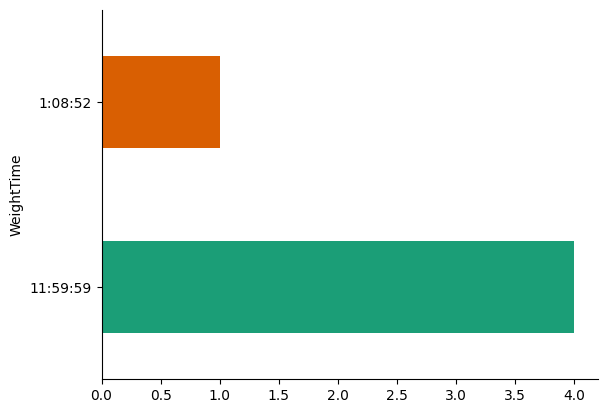

In [ ]:
# Create a bar chart to represent WeightTime

_df_6.groupby('WeightTime').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

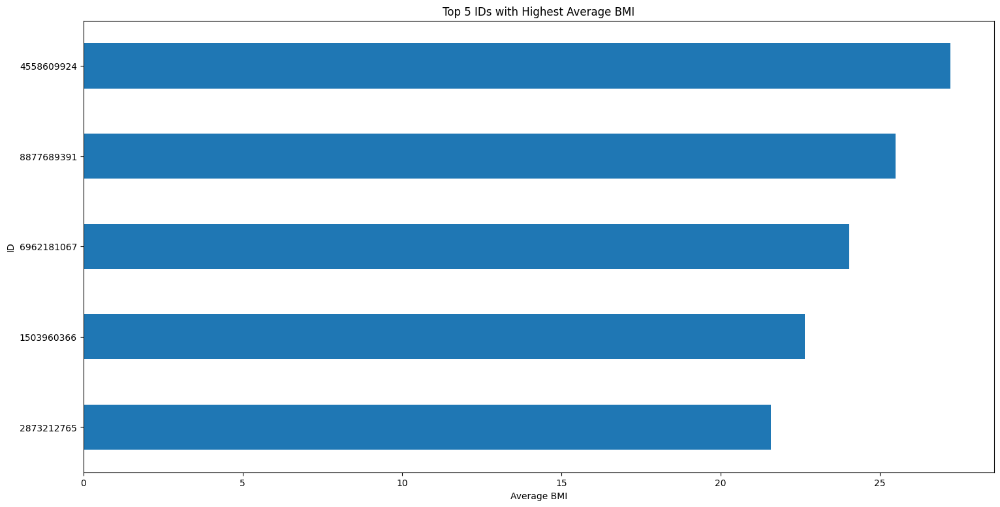

In [ ]:
# Create a top 5 horizontal and vertical bar chart to represent ID and BMI

# Create a top 5 horizontal bar chart for ID and BMI
bmi_by_id = WeightData.groupby('Id')['BMI'].mean().sort_values(ascending=True).head(5)
bmi_by_id.plot.barh(title='Top 5 IDs with Highest Average BMI', figsize=(18, 9))
plt.xlabel('Average BMI')
plt.ylabel('ID')
plt.show()


In [ ]:
WeightData.head()

,Id,WeightDate,WeightKg,WeightPounds,Fat,BMI,IsManualReport,LogId,WeightTime
0,1503960366,5/2/2016,52.599998,115.963147,22.0,22.650000,True,1462233599000,11:59:59
1,1503960366,5/3/2016,52.599998,115.963147,23.5,22.650000,True,1462319999000,11:59:59
2,1927972279,4/13/2016,133.500000,294.317120,23.5,47.540001,False,1460509732000,1:08:52
3,2873212765,4/21/2016,56.700001,125.002104,23.5,21.450001,True,1461283199000,11:59:59
4,2873212765,5/12/2016,57.299999,126.324875,23.5,21.690001,True,1463097599000,11:59:59


# **Heart rate EDA Analysis and visualisation**

In [ ]:
Heartrate = pd.read_csv('/content/drive/MyDrive/Assignment-8/heartrate_seconds_merged.csv')

In [ ]:
Heartrate.head()

,Id,Time,Value
0,2022484408,4/12/2016 7:21:00 AM,97
1,2022484408,4/12/2016 7:21:05 AM,102
2,2022484408,4/12/2016 7:21:10 AM,105
3,2022484408,4/12/2016 7:21:20 AM,103
4,2022484408,4/12/2016 7:21:25 AM,101


In [ ]:
Heartrate.shape

(2483658, 3)

In [ ]:
Heartrate.info

<bound method DataFrame.info of                  Id                  Time  Value
0        2022484408  4/12/2016 7:21:00 AM     97
1        2022484408  4/12/2016 7:21:05 AM    102
2        2022484408  4/12/2016 7:21:10 AM    105
3        2022484408  4/12/2016 7:21:20 AM    103
4        2022484408  4/12/2016 7:21:25 AM    101
...             ...                   ...    ...
2483653  8877689391  5/12/2016 2:43:53 PM     57
2483654  8877689391  5/12/2016 2:43:58 PM     56
2483655  8877689391  5/12/2016 2:44:03 PM     55
2483656  8877689391  5/12/2016 2:44:18 PM     55
2483657  8877689391  5/12/2016 2:44:28 PM     56

[2483658 rows x 3 columns]>

In [ ]:
Heartrate.dtypes

Id        int64
Time     object
Value     int64
dtype: object

In [ ]:
Heartrate.isnull().sum()

Id       0
Time     0
Value    0
dtype: int64

In [ ]:
# Rename the time column named heart rate time

Heartrate.rename(columns={'Time': 'HeartRateTime'}, inplace=True)


In [ ]:
# Create a copy of time column named heart rate date

Heartrate['HeartRateDate'] = Heartrate['HeartRateTime'].copy()


In [ ]:
Heartrate['HeartRateDate'] = Heartrate['HeartRateDate'].apply(lambda x: x.split(' ')[0])


In [ ]:
# in HeartRateTime Remove date month and year

Heartrate['HeartRateTime'] = Heartrate['HeartRateTime'].apply(lambda x: x.split(' ')[1])


In [ ]:
# Display duplicate

duplicate_rows = Heartrate[Heartrate.duplicated()]
print(duplicate_rows)


                 Id HeartRateTime  Value HeartRateDate
4834     2022484408       7:51:30     90     4/12/2016
9972     2022484408       7:23:15     83     4/13/2016
10093    2022484408       7:41:25     75     4/13/2016
15446    2022484408       7:53:25     87     4/14/2016
15452    2022484408       7:54:20     86     4/14/2016
...             ...           ...    ...           ...
2480034  8877689391      10:16:21     63     5/11/2016
2480048  8877689391      10:17:56     66     5/11/2016
2480074  8877689391      10:21:41     67     5/11/2016
2480087  8877689391      10:23:21     65     5/11/2016
2480090  8877689391      10:23:51     67     5/11/2016

[9334 rows x 4 columns]


In [ ]:
#Remove all duplicate values

Heartrate.drop_duplicates(inplace=True)


In [ ]:
# In heart rate date change the format date month and year

Heartrate['HeartRateDate'] = pd.to_datetime(Heartrate['HeartRateDate']).dt.strftime('%d/%m/%Y')


In [ ]:
# Change the position of hot rate date in the 3rd place

new_cols = list(Heartrate.columns)
new_cols.remove('HeartRateDate')
new_cols.insert(2, 'HeartRateDate')
Heartrate = Heartrate[new_cols]
Heartrate.head()


,Id,HeartRateTime,HeartRateDate,Value
0,2022484408,7:21:00,12/04/2016,97
1,2022484408,7:21:05,12/04/2016,102
2,2022484408,7:21:10,12/04/2016,105
3,2022484408,7:21:20,12/04/2016,103
4,2022484408,7:21:25,12/04/2016,101


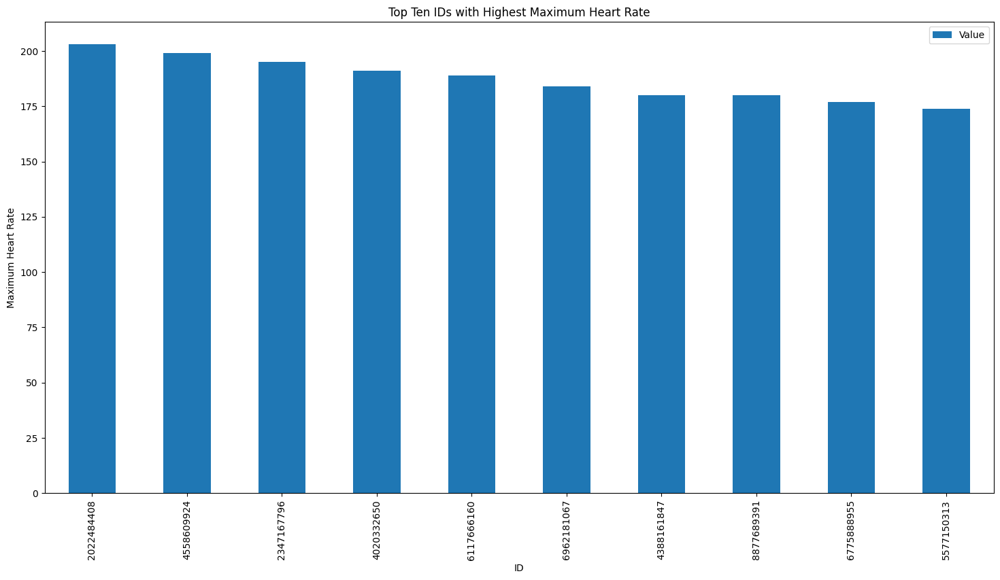

In [ ]:
# Create bar chart to represent ID and highest 10 Value

# Group by ID and get the maximum value
max_value_by_id = Heartrate.groupby('Id')['Value'].max()

# Sort by maximum value in descending order
max_value_by_id = max_value_by_id.sort_values(ascending=False)

# Get the top ten IDs with the highest maximum value
top_ten_ids = max_value_by_id.head(10).index

# Create a bar chart for the top ten IDs
top_ten_ids_df = max_value_by_id[top_ten_ids].to_frame().reset_index()
top_ten_ids_df.plot.bar(x='Id', y='Value', figsize=(18, 9))

# Add title and labels
plt.title('Top Ten IDs with Highest Maximum Heart Rate')
plt.xlabel('ID')
plt.ylabel('Maximum Heart Rate')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Show the plot
plt.show()


In [ ]:
#Show the which I D has highest value

max_value_id = Heartrate['Id'].loc[Heartrate['Value'].idxmax()]
print(f"ID with highest value: {max_value_id}")


ID with highest value: 2022484408


In [ ]:
# Show this ID 2022484408 In a line chart Value and Based onHeartRateDate column

id_data = Heartrate[Heartrate['Id'] == 2022484408]

# Create a line chart
fig = go.Figure(data=go.Scatter(x=id_data['HeartRateDate'], y=id_data['Value'], mode='lines'))

# Update the layout
fig.update_layout(title='Heart Rate Values for ID 2022484408', xaxis_title='HeartRateDate', yaxis_title='Value')

# Show the line chart
fig.show()


In [ ]:
#Show the which ID has lowest value

min_value_id = Heartrate['Id'].loc[Heartrate['Value'] == Heartrate['Value'].min()].iloc[0]
print(f"ID with the lowest value: {min_value_id}")


ID with the lowest value: 5577150313


In [ ]:
# Show this ID 5577150313 In a line chart Value and Based onHeartRateDate column

id_data = Heartrate[Heartrate['Id'] == 5577150313]

# Create a line chart
fig = go.Figure(data=go.Scatter(x=id_data['HeartRateDate'], y=id_data['Value'], mode='lines'))

# Update the layout
fig.update_layout(title='Heart Rate Values for ID 5577150313', xaxis_title='HeartRateDate', yaxis_title='Value')

# Show the line chart
fig.show()


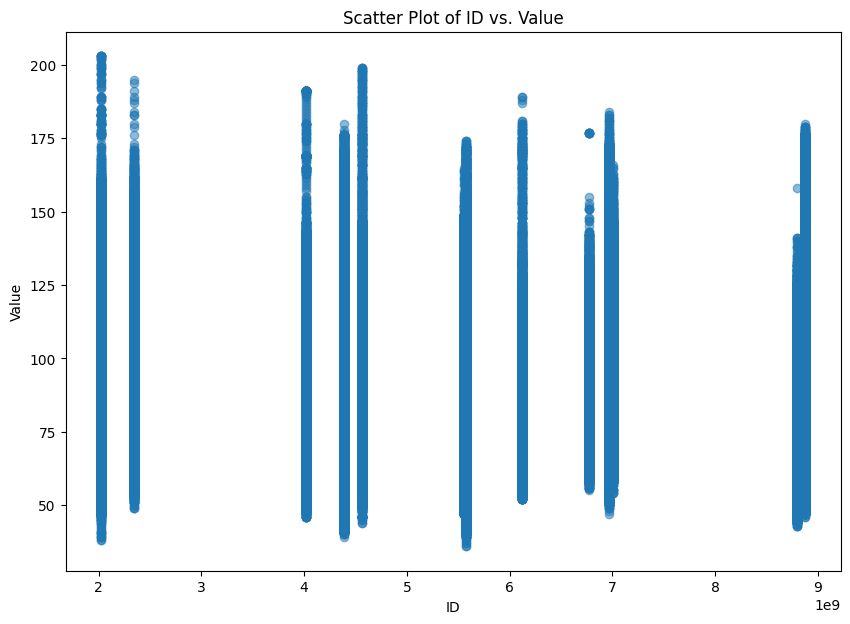

In [ ]:
#Create a Scatter plot to represent ID and value

plt.figure(figsize=(10, 7))
plt.scatter(Heartrate['Id'], Heartrate['Value'], alpha=0.5)  # 'alpha' controls transparency for better visualization

# Add labels and title
plt.xlabel('ID')
plt.ylabel('Value')
plt.title('Scatter Plot of ID vs. Value')

# Show the plot
plt.show()


In [ ]:
Heartrate.head()

,Id,HeartRateTime,HeartRateDate,Value
0,2022484408,7:21:00,12/04/2016,97
1,2022484408,7:21:05,12/04/2016,102
2,2022484408,7:21:10,12/04/2016,105
3,2022484408,7:21:20,12/04/2016,103
4,2022484408,7:21:25,12/04/2016,101


# **Business Task:**

# **●	What are the trends identified?**

Based on the above code snippets and analysis, here are some potential trends identified in the data:

1. **Physical Activity Patterns:**
   - The dataset includes information about daily and hourly physical activity, including steps, calories burned, and intensity levels.
   - By analyzing these patterns, you can identify individuals with consistent or irregular activity levels.

2. **Sleep Patterns:**
   - Sleep data is available, providing insights into total sleep records, total minutes asleep, and total time in bed.
   - Patterns in sleep duration and quality can be identified, helping to understand individuals' sleep habits.

3. **Weight and Body Metrics:**
   - The dataset includes information on weight, BMI, and fat percentage.
   - Trends in weight change, BMI variation, and fat percentage can be analyzed over time for each individual.

4. **Heart Rate Analysis:**
   - Heart rate data is available at a fine-grained level, capturing values at specific times.
   - Patterns in heart rate during different activities or times of the day can be explored.



# **●	How could these trends apply to customers?**


1. **Personalized Health Insights:**
   - Customers can receive personalized insights into their physical activity, sleep, and weight trends.
   - This information can help individuals understand their habits, set health goals, and make informed decisions about their lifestyle.

2. **Wellness Recommendations:**
   - Based on identified trends, customers can receive recommendations for improving their overall well-being.
   - For example, if irregular sleep patterns are identified, suggestions for better sleep hygiene can be provided.

3. **Targeted Fitness Plans:**
   - Fitness plans can be tailored to individual preferences and patterns.
   - Customers with specific activity preferences or challenges can receive targeted recommendations for exercise routines.



# **●	How could these trends help influence marketing strategy?**

1. **Segmented Marketing:**
   - Identify customer segments based on activity levels, sleep patterns, and weight metrics.
   - Tailor marketing campaigns to address the unique needs and interests of each segment.

2. **Promotions for Health Products:**
   - Launch promotions for health and fitness products based on identified trends.
   - For instance, market sleep-related products if irregular sleep patterns are prevalent among the target audience.

3. **Health and Wellness Programs:**
   - Develop marketing strategies around comprehensive health and wellness programs.
   - Highlight how products or services contribute to improved physical activity, better sleep, and overall well-being.

4. **Customized Fitness Apps:**
   - If irregular activity patterns are identified, marketing efforts can focus on promoting fitness apps or solutions that provide personalized workout plans.

5. **Engagement and Rewards:**
   - Create engagement strategies that reward customers for achieving specific health goals.
   - Loyalty programs can be designed to encourage continued use of health and fitness-related products or services.

In summary, understanding trends in physical activity, sleep, weight, and heart rate can provide valuable insights for creating personalized customer experiences and targeted marketing strategies in the health and wellness industry.

# **Deliverables:**

**# 1. Clear Summary of the Business Task:**

Clearly articulate the primary business task or problem you are addressing. For example:

- The business task is to analyze health and fitness data to derive actionable insights that can be used to improve customer experience, tailor marketing strategies, and enhance product offerings in the health and wellness industry.

**# 2. Description of Data Sources:**

Provide information about the data sources you utilized. This might include:

- The dataset contains records of physical activity, sleep patterns, weight metrics, and heart rate collected from wearable devices and mobile apps.
- Data sources may include APIs, databases, or third-party platforms.

**# 3. Documentation of Data Cleaning/Manipulation:**

Detail the steps taken to clean and manipulate the data. This could involve:

- Handling missing values: Explain how missing values were treated (removed, imputed, etc.).
- Standardizing units or formats: Detail any efforts to ensure consistency in the dataset.
- Removing outliers: Mention if outliers were identified and addressed.

**# 4. Summary of the Analysis:**

Provide a concise overview of the analysis conducted. For instance:

- The analysis focused on identifying trends in physical activity, sleep, weight, and heart rate.
- Key metrics such as average steps per day, sleep duration, and heart rate patterns were examined.

**# 5. Supporting Visualizations and Key Findings:**

Include relevant visualizations (charts, graphs, etc.) and highlight key findings:

- Visualizations might include time series plots of physical activity, histograms of sleep duration, or pie charts representing activity types.
- Key findings could include insights into common sleep patterns, peak activity times, or correlations between activity levels and heart rate.

**# 6. High-level Content Recommendations:**

Based on your analysis, provide high-level recommendations for the business:

- Personalized Health Insights: Develop features or products that provide personalized health insights to customers.
- Targeted Marketing: Tailor marketing strategies based on identified customer segments.
- Wellness Programs: Consider launching wellness programs aligned with customer needs.

